In [ ]:
! pip install -q kaggle

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"mahimamittal","key":"08d9cfc8d74b688ff4dd4691ec49bdc5"}'}

In [ ]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d skooch/ddsm-mammography

100% 2.88G/2.88G [00:46<00:00, 34.3MB/s]
100% 2.88G/2.88G [00:46<00:00, 66.4MB/s]


In [ ]:
!unzip \*.zip  && rm *.zip

Archive:  ddsm-mammography.zip
  inflating: cv10_data/cv10_data.npy  
  inflating: cv10_labels.npy         
  inflating: test10_data/test10_data.npy  
  inflating: test10_labels.npy       
  inflating: training10_0/training10_0.tfrecords  
  inflating: training10_1/training10_1.tfrecords  
  inflating: training10_2/training10_2.tfrecords  
  inflating: training10_3/training10_3.tfrecords  
  inflating: training10_4/training10_4.tfrecords  


In [ ]:
!ls

cv10_data	 sample_data	    training10_0  training10_3
cv10_labels.npy  test10_data	    training10_1  training10_4
kaggle.json	 test10_labels.npy  training10_2


In [ ]:
!pip install preprocessing

     |████████████████████████████████| 358kB 5.1MB/s 
     |████████████████████████████████| 1.4MB 9.7MB/s 
     |████████████████████████████████| 1.2MB 24.5MB/s 
  Created wheel for nltk: filename=nltk-3.2.4-cp37-none-any.whl size=1367720 sha256=bb592569324a7558ebc9cc09b4e54f76e639f3008eabc28581a893b63b15ab5a
  Stored in directory: /root/.cache/pip/wheels/36/f1/5c/f667347d86a3a534ba4c0127eed4389f929916e3ec88bb461a
Successfully built nltk
  Found existing installation: nltk 3.2.5
    Uninstalling nltk-3.2.5:
      Successfully uninstalled nltk-3.2.5


In [ ]:
import cv2
import numpy as np
import pandas as pd
import preprocessing
import matplotlib.pyplot as plt

from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report
# from sklearn.utils import compute_class_weight
from sklearn.model_selection import KFold

import tensorflow as tf
# from tensorflow.keras.utils import to_categorical
from tensorflow.keras.metrics import AUC
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import LSTM, Dropout, Dense, TimeDistributed, Conv1D, MaxPooling1D, Flatten

In [ ]:
images=[]
labels=[]
labels_normal=[]
feature_dictionary = {
    'label': tf.io.FixedLenFeature([], tf.int64),
    'label_normal': tf.io.FixedLenFeature([], tf.int64),
    'image': tf.io.FixedLenFeature([], tf.string)
    }

print(feature_dictionary)

{'label': FixedLenFeature(shape=[], dtype=tf.int64, default_value=None), 'label_normal': FixedLenFeature(shape=[], dtype=tf.int64, default_value=None), 'image': FixedLenFeature(shape=[], dtype=tf.string, default_value=None)}


In [ ]:
def _parse_function(example, feature_dictionary=feature_dictionary):
    parsed_example = tf.io.parse_example(example, feature_dictionary)
    return parsed_example

def read_data(filename):
    full_dataset = tf.data.TFRecordDataset(filename,num_parallel_reads=tf.data.experimental.AUTOTUNE)
    full_dataset = full_dataset.shuffle(buffer_size=31000)
    full_dataset = full_dataset.cache()
    print("Size of Training Dataset: ", len(list(full_dataset)))

    feature_dictionary = {
    'label': tf.io.FixedLenFeature([], tf.int64),
    'label_normal': tf.io.FixedLenFeature([], tf.int64),
    'image': tf.io.FixedLenFeature([], tf.string)
    }

    full_dataset = full_dataset.map(_parse_function, num_parallel_calls=tf.data.experimental.AUTOTUNE)
    print("full_dataset", full_dataset)
    for image_features in full_dataset:
        image = image_features['image'].numpy()
        # print("image", image)
        image = tf.io.decode_raw(image_features['image'], tf.uint8)
        image = tf.reshape(image, [299, 299,1])
        image=image.numpy()
        image=cv2.resize(image,(100,100))
#         image=cv2.merge([image,image,image])
        plt.imshow(image)
        images.append(image)
        labels.append(image_features['label'].numpy())
        labels_normal.append(image_features['label_normal'].numpy())

Size of Training Dataset:  11177
full_dataset <ParallelMapDataset shapes: {image: (), label: (), label_normal: ()}, types: {image: tf.string, label: tf.int64, label_normal: tf.int64}>
11177
11177
[1, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 4, 0, 0, 4, 0, 0, 2, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 2, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 4, 0, 0, 1, 1, 4, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0,

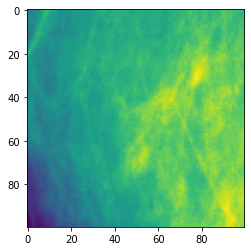

In [ ]:
filenames=[
           #'/content/training10_0/training10_0.tfrecords']
          #'/content/training10_1/training10_1.tfrecords']
           #'/content/training10_2/training10_2.tfrecords']
           '/content/training10_3/training10_3.tfrecords']
          # '/content/training10_4/training10_4.tfrecords']

for file in filenames:
    read_data(file)

print(len(images))
#print(images)
print(len(labels))
print(labels)
print(labels_normal)

In [ ]:
X=np.array(images)
y=np.array(labels)
kfold = KFold(n_splits=10, shuffle=True)
for train, test in kfold.split(images, labels):
  print("Train: ", train, "Test: ", test)
  x_train, x_test = X[train], X[test]
  y_train, y_test = y[train], y[test]

print(x_train.shape)
print(x_test.shape)
print(y_train.shape)

(a,b,c)=x_train.shape
x_train = np.reshape(x_train, (a, b, c, 1))
(a, b, c)=x_test.shape
x_test = np.reshape(x_test, (a, b, c, 1))

Train:  [    0     1     2 ... 11174 11175 11176] Test:  [    4    15    18 ... 11142 11143 11159]
Train:  [    0     1     2 ... 11174 11175 11176] Test:  [    8    48    49 ... 11157 11166 11167]
Train:  [    0     1     2 ... 11174 11175 11176] Test:  [    5     9    17 ... 11138 11148 11153]
Train:  [    0     1     2 ... 11174 11175 11176] Test:  [    3    22    26 ... 11151 11154 11170]
Train:  [    0     1     2 ... 11172 11174 11176] Test:  [   21    27    46 ... 11162 11173 11175]
Train:  [    2     3     4 ... 11174 11175 11176] Test:  [    0     1    41 ... 11144 11158 11169]
Train:  [    0     1     2 ... 11173 11174 11175] Test:  [    6    11    14 ... 11161 11172 11176]
Train:  [    0     1     3 ... 11173 11175 11176] Test:  [    2    19    25 ... 11168 11171 11174]
Train:  [    0     1     2 ... 11174 11175 11176] Test:  [    7    10    12 ... 11160 11163 11164]
Train:  [    0     1     2 ... 11174 11175 11176] Test:  [   13    28    33 ... 11126 11129 11141]
(10060, 10

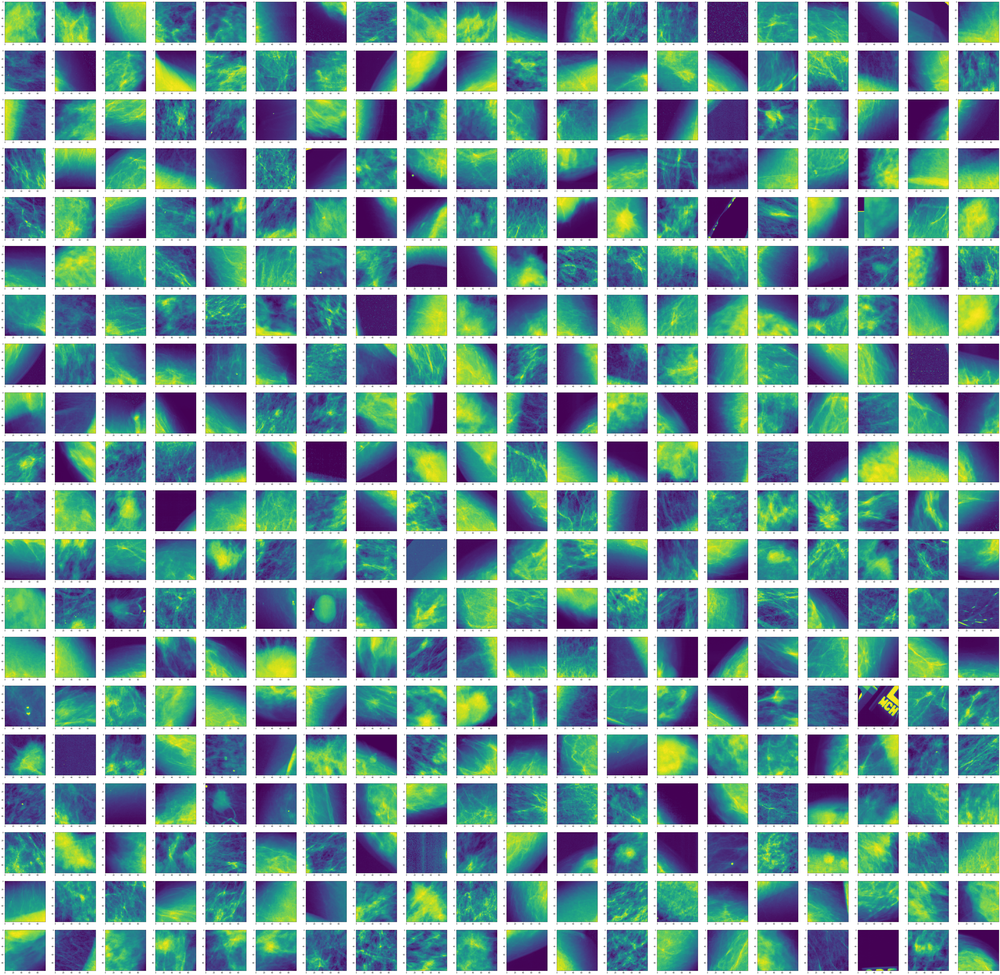

In [ ]:
fig = plt.figure(figsize=(100,100))
for i in range(0,400):
  plt.rcParams['axes.grid']=False
  img= fig.add_subplot(20,20,i+1)
  plt.imshow(X[i].reshape(100,100), aspect=1, interpolation='nearest')

In [ ]:
import numpy as np
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Conv2D, MaxPool2D, Flatten
from keras import optimizers
from keras import losses
from sklearn import metrics

In [ ]:
rows, cols,color = x_train[0].shape
model = Sequential()

model.add(Conv2D(32, (3, 3), padding='valid', strides=(1, 1),input_shape=(rows,cols,1)))
model.add(Activation('relu'))
model.add(MaxPool2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3, 3), padding='same', strides=(1, 1)))
model.add(Activation('relu'))
model.add(MaxPool2D(pool_size=(2, 2),strides=2))
model.add(Dropout(0.2))

# model.add(Conv2D(64, (3, 3), padding='same', strides=(1, 1)))
# model.add(Activation('relu'))
# model.add(MaxPool2D(pool_size=(2, 2),strides=2))

model.add(Conv2D(32, (3, 3), padding='same', strides=(1, 1)))
model.add(Activation('relu'))
model.add(MaxPool2D(pool_size=(2, 2),strides=2))

model.add(Dropout(0.2))
model.add(Flatten())
model.add(Dense(1))
model.add(Activation('sigmoid'))

model.summary()


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 98, 98, 32)        320       
_________________________________________________________________
activation (Activation)      (None, 98, 98, 32)        0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 49, 49, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 49, 49, 64)        18496     
_________________________________________________________________
activation_1 (Activation)    (None, 49, 49, 64)        0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 24, 24, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 24, 24, 64)        0

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
es = EarlyStopping(monitor='val_loss', mode='min', patience=6,restore_best_weights=True, verbose=1)

In [ ]:
model.compile(optimizer='adam',loss='binary_crossentropy', metrics=['accuracy'])
history = model.fit(x_train, y_train,validation_split=0.2,shuffle=True, epochs=20, batch_size=64,callbacks=[es], verbose=True)
loss_value , accuracy = model.evaluate(x_test, y_test)

print('Test_loss_value = ' +str(loss_value))
print('test_accuracy = ' + str(accuracy))

Epoch 1/20
126/126 [==============================] - 123s 970ms/step - loss: -0.0674 - accuracy: 0.6482 - val_loss: 0.2908 - val_accuracy: 0.6864
Epoch 2/20
126/126 [==============================] - 121s 960ms/step - loss: -0.6994 - accuracy: 0.6156 - val_loss: 0.2288 - val_accuracy: 0.5408
Epoch 3/20
126/126 [==============================] - 120s 955ms/step - loss: -1.8760 - accuracy: 0.6324 - val_loss: 0.0853 - val_accuracy: 0.6029
Epoch 4/20
126/126 [==============================] - 121s 957ms/step - loss: -3.6533 - accuracy: 0.5886 - val_loss: 1.8335 - val_accuracy: 0.5875
Epoch 5/20
126/126 [==============================] - 121s 959ms/step - loss: -7.0547 - accuracy: 0.5994 - val_loss: 4.3550 - val_accuracy: 0.7560
Epoch 6/20
126/126 [==============================] - 121s 958ms/step - loss: -6.7938 - accuracy: 0.6035 - val_loss: 12.5162 - val_accuracy: 0.8007
Epoch 7/20
126/126 [==============================] - 121s 964ms/step - loss: -18.5882 - accuracy: 0.6005 - val_loss:

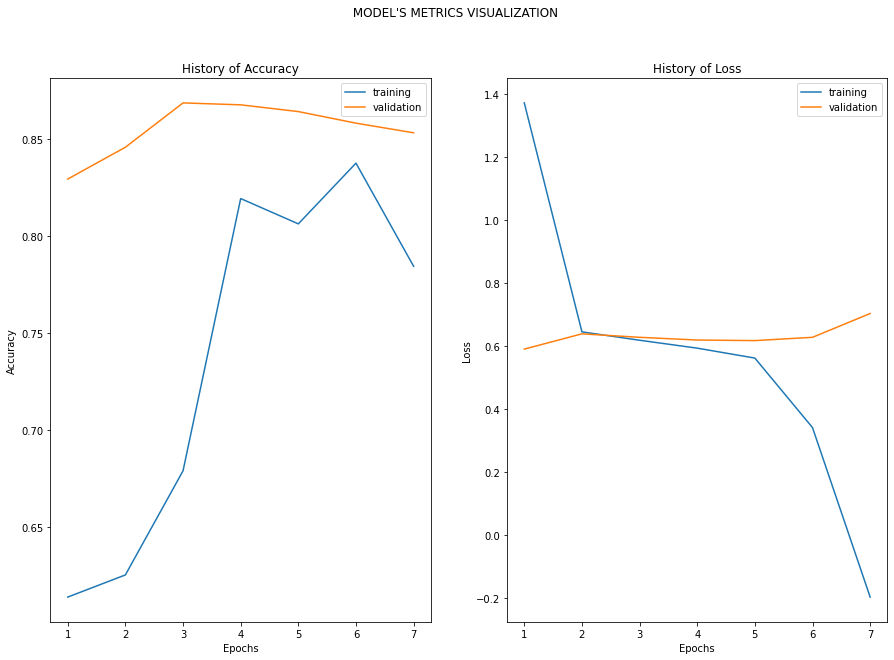

In [ ]:
import matplotlib.pyplot as plt
def Train_Val_Plot(acc,val_acc,loss,val_loss):

    fig, (ax1, ax2) = plt.subplots(1,2, figsize= (15,10))
    fig.suptitle(" MODEL'S METRICS VISUALIZATION ")

    ax1.plot(range(1, len(acc) + 1), acc)
    ax1.plot(range(1, len(val_acc) + 1), val_acc)
    ax1.set_title('History of Accuracy')
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Accuracy')
    ax1.legend(['training', 'validation'])


    ax2.plot(range(1, len(loss) + 1), loss)
    ax2.plot(range(1, len(val_loss) + 1), val_loss)
    ax2.set_title('History of Loss')
    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('Loss')
    ax2.legend(['training', 'validation'])
    plt.show()


Train_Val_Plot(history.history['accuracy'],history.history['val_accuracy'],
               history.history['loss'],history.history['val_loss'])

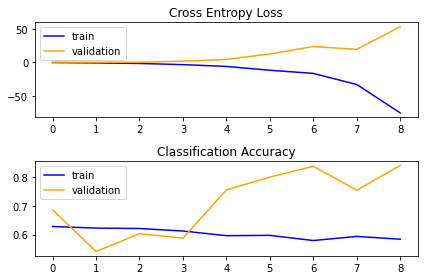

In [ ]:
ax1 = plt.subplot(211)
plt.title('Cross Entropy Loss')
ax1.plot(history.history['loss'], color='blue', label='train')
ax1.plot(history.history['val_loss'], color='orange', label='validation')
ax1.legend()
    # plot accuracy
ax2 = plt.subplot(212)
plt.title('Classification Accuracy')
ax2.plot(history.history['accuracy'], color='blue', label='train')
ax2.plot(history.history['val_accuracy'], color='orange', label='validation')
ax2.legend()
plt.tight_layout()

In [ ]:
y_pred=model.predict_classes(x_test)
y_pred_prb=model.predict_proba(x_test)

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


In [ ]:
# target=["0","1"]
from sklearn import metrics
print('Accuracy:', np.round(metrics.accuracy_score(y_test, y_pred),4))
print('Precision:', np.round(metrics.precision_score(y_test, y_pred, average='weighted'),4))
print('Recall:', np.round(metrics.recall_score(y_test,y_pred, average='weighted'),4))
print('F1 Score:', np.round(metrics.f1_score(y_test, y_pred, average='weighted'),4))
# print('ROC AUC Score:', np.round(metrics.roc_auc_score(y_test, y_pred_prb,multi_class='ovo', average='weighted'),4))
# print('Cohen Kappa Score:', np.round(metrics.cohen_kappa_score(y_test, y_pred),4))
# print('\t\tClassification Report:\n', metrics.classification_report(y_test, y_pred,target_names=target))

Accuracy: 0.6195
Precision: 0.8461
Recall: 0.6195
F1 Score: 0.7005


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


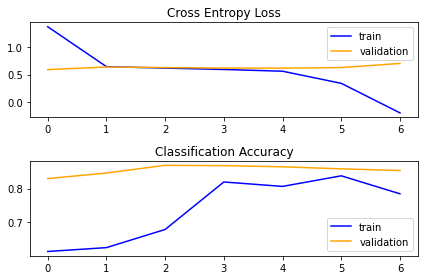

In [ ]:
ax1 = plt.subplot(211)
plt.title('Cross Entropy Loss')
ax1.plot(history.history['loss'], color='blue', label='train')
ax1.plot(history.history['val_loss'], color='orange', label='validation')
ax1.legend()
    # plot accuracy
ax2 = plt.subplot(212)
plt.title('Classification Accuracy')
ax2.plot(history.history['accuracy'], color='blue', label='train')
ax2.plot(history.history['val_accuracy'], color='orange', label='validation')
ax2.legend()
plt.tight_layout()

Text(0.5, 1.0, 'Confusion Matrix')

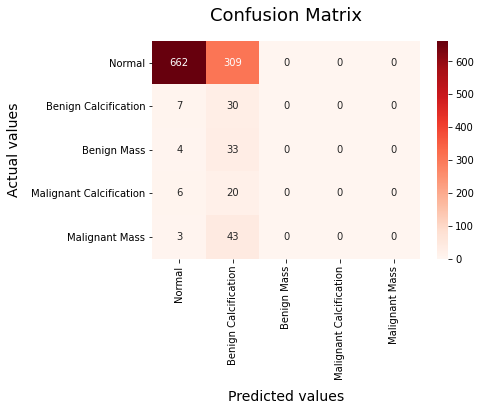

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
cf_matrix = confusion_matrix(y_test, y_pred)
categories= ['Normal','Benign Calcification', 'Benign Mass', 'Malignant Calcification', 'Malignant Mass']
group_names = ['True Neg','False Pos', 'False Neg','True Pos']
group_percentages = ['{0:.2%}'.format(value) for value in cf_matrix.flatten() / np.sum(cf_matrix)]

labels = [f'{v1}\n{v2}' for v1, v2 in zip(group_names,group_percentages)]
labels = np.asarray(labels).reshape(2,2)

sns.heatmap(cf_matrix, annot = True, cmap = 'Reds',fmt = '', xticklabels = categories, yticklabels = categories)

plt.xlabel("Predicted values", fontdict = {'size':14}, labelpad = 10)
plt.ylabel("Actual values"   , fontdict = {'size':14}, labelpad = 10)
plt.title ("Confusion Matrix", fontdict = {'size':18}, pad = 20)

In [ ]:
from scipy import interp
from itertools import cycle
from sklearn.metrics import roc_curve, auc

In [ ]:
pred_mul = model.predict(x_test, batch_size = 32, verbose = 0)

In [ ]:
pred_mul

array([[3.141755e-02],
       [1.000000e+00],
       [9.876983e-01],
       ...,
       [9.846345e-01],
       [8.682219e-05],
       [6.702608e-02]], dtype=float32)

In [ ]:
sensitivity has increased (used to be 0.24)
print (46 / float(46 + 16))

In [ ]:
# print the first 10 predicted classes with the lower threshold
y_pred[0:10]

array([[0],
       [1],
       [1],
       [1],
       [0],
       [0],
       [0],
       [0],
       [0],
       [1]], dtype=int32)

In [ ]:
print(metrics.confusion_matrix(y_test, y_pred))

[[662 309   0   0   0]
 [  7  30   0   0   0]
 [  4  33   0   0   0]
 [  6  20   0   0   0]
 [  3  43   0   0   0]]
